# Sheet

# Memecoin Strategy based on Social Data

An example strategy backtest loading external social data to drive decision making in this automated memecoin strategy. Enter into trades where there is an uptick in mindshare

# Set up

Set up Trading Strategy data client.

In [1]:
from tradeexecutor.utils.notebook import setup_charting_and_output
from tradingstrategy.client import Client
from tradeexecutor.utils.notebook import setup_charting_and_output, OutputMode
# import ipdb

client = Client.create_jupyter_client()

# Set up drawing charts in interactive vector output mode.
# This is slower. See the alternative commented option below.
# Kernel restart needed if you change output mode.
# setup_charting_and_output(OutputMode.interactive)

# Set up rendering static PNG images.
# This is much faster but disables zoom on any chart.
setup_charting_and_output(OutputMode.static, image_format="png", width=1500, height=1000)

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/gui/.tradingstrategy


# Prerequisites

To run this backtest, you first need to run `scripts/prefilter-ethereum.py` to build a Polygon dataset (> 1 GB) for this backtest based on more than 10 GB downloaded data.

In [2]:
from pathlib import Path

import pandas as pd

from tradingstrategy.chain import ChainId
from tradingstrategy.client import Client
from tradingstrategy.timebucket import TimeBucket
import datetime

liquidity_output_fname = Path("/tmp/eth-liquidity-prefiltered.parquet")
price_output_fname = Path("/tmp/eth-price-prefiltered.parquet")

# If the pair does not have this liquidity, skip
min_prefilter_liquidity = 10_000

chain_id = ChainId.bsc
time_bucket = TimeBucket.d1
client = Client.create_jupyter_client()

# We need pair metadata to know which pairs belong to Polygon
print("Downloading/opening pairs dataset")
pairs_df = client.fetch_pair_universe().to_pandas()
our_chain_pair_ids = pairs_df[pairs_df.chain_id == chain_id.value]["pair_id"].unique()

print(f"We have data for {len(our_chain_pair_ids)} trading pairs on {chain_id.name}")

# Download all liquidity data, extract
# trading pairs that exceed our prefiltering threshold
print("Downloading/opening liquidity dataset")
liquidity_df = client.fetch_all_liquidity_samples(time_bucket).to_pandas()
print(f"Filtering out liquidity for chain {chain_id.name}")
liquidity_df = liquidity_df.loc[liquidity_df.pair_id.isin(our_chain_pair_ids)]
liquidity_df = liquidity_df.loc[liquidity_df.timestamp > datetime.datetime(2023, 1, 1)]
liquidity_per_pair = liquidity_df.groupby(liquidity_df.pair_id)
print(f"Chain {chain_id.name} has liquidity data for {len(liquidity_per_pair.groups)}")

passed_pair_ids = set()
liquidity_output_chunks = []

for pair_id, pair_df in liquidity_per_pair:
    if pair_df["high"].max() > min_prefilter_liquidity:
        liquidity_output_chunks.append(pair_df)
        passed_pair_ids.add(pair_id)

print(f"After filtering for {min_prefilter_liquidity:,} USD min liquidity we have {len(passed_pair_ids)} pairs")

liquidity_out_df = pd.concat(liquidity_output_chunks)
liquidity_out_df.to_parquet(liquidity_output_fname)

print(f"Wrote {liquidity_output_fname}, {liquidity_output_fname.stat().st_size:,} bytes")

print("Downloading/opening OHLCV dataset")
price_df = client.fetch_all_candles(time_bucket).to_pandas()
price_df = price_df.loc[price_df.pair_id.isin(passed_pair_ids)]
price_df.to_parquet(price_output_fname)

print(f"Wrote {price_output_fname}, {price_output_fname.stat().st_size:,} bytes")

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/gui/.tradingstrategy
Downloading/opening pairs dataset


We have data for 168662 trading pairs on bsc
Downloading/opening liquidity dataset


Filtering out liquidity for chain bsc
Chain bsc has liquidity data for 105021
After filtering for 10,000 USD min liquidity we have 30642 pairs
Wrote /tmp/eth-liquidity-prefiltered.parquet, 163,184,586 bytes
Downloading/opening OHLCV dataset


Wrote /tmp/eth-price-prefiltered.parquet, 396,763,357 bytes


In [3]:
from pathlib import Path
import pandas as pd
# See scripts/prefilter-polygon.py

liquidity_output_fname = Path("/tmp/eth-liquidity-prefiltered.parquet")
price_output_fname = Path("/tmp/eth-price-prefiltered.parquet")

assert price_output_fname.exists(), "Run prefilter script first"
assert liquidity_output_fname.exists(), "Run prefilter script first"

# Custom data

In [4]:
import os
import json
from google.oauth2 import service_account

# Assuming the JSON credentials are stored in an environment variable as a string
credentials_json = os.getenv("GOOGLE_APPLICATION_CREDENTIALS")

# Parse the JSON string into a Python dictionary
credentials_dict = json.loads(credentials_json)

# Use the dictionary to create credentials
credentials = service_account.Credentials.from_service_account_info(credentials_dict)

# Now you can use `credentials` with Google Cloud client libraries

TypeError: the JSON object must be str, bytes or bytearray, not NoneType

In [ ]:
# Prepare the storage_options to pass to read_csv
storage_options = {
    'token': credentials_dict
}


Load the custom data from a CSV file.

- Load using Pandas
- This data will be split and mapped to per-pair indicators later on, as the data format is per-pair

*Note*: Relative paths work different in different notebook run-time environments. Below is for Visual Studio Code.

In [97]:
df_platforms = pd.read_csv(
        "gs://taraxa-research/coingecko_data_pipeline/df_platforms.csv",
    )

df_categories = pd.read_csv(
    "gs://taraxa-research/coingecko_data_pipeline/df_categories.csv",
)

df_stablecoins = df_categories[df_categories["category_name"] == "Stablecoins"]

df_markets_data = pd.read_parquet(
    "gs://taraxa-research/coingecko_data_pipeline/df_market_data_historical.parquet",
)
df_trend = pd.read_parquet(
    "gs://taraxa-research/trend_spotting/trends_v1.parquet",
)

In [102]:

category = "BNB Chain"

df_trend.reset_index(inplace=True)
print(f"Length of df_trend: {len(df_trend)} before category filtering")
df_trend_category = df_trend.merge(
    df_platforms[df_platforms["platform_name"] == category],
    on="coin_id",
    how="inner",
)
print(f"Length of df_trend: {len(df_trend)} before meme filtering")

# Create a list of categories we want to merge
categories = ["Meme", "Dog-Themed", "Cat-Themed"]

# Create a DataFrame with all these categories
df_categories_filtered = df_categories[df_categories["category_name"].isin(categories)]

print(f"Length of df_categories_filtered: {len(df_categories_filtered)}")
print(f"df_trend_category len {len(df_trend_category)}")
# Merge df_trend_category with the filtered categories
df_trend_merged = df_trend_category.merge(
    df_categories_filtered,
    on="coin_id",
    how="inner"
)
print(f"Length of df_trend_merged: {len(df_trend_merged)}")
# Remove duplicates if a coin belongs to multiple categories
df_trend_merged = df_trend_merged.drop_duplicates(subset=["coin_id", "date"])
print(f"Length of df_trend_merged after dropping duplicates: {len(df_trend_merged)}")

# # If you want to keep track of which categories each coin belongs to:
# df_trend_merged["categories"] = df_trend_merged.groupby("coin_id")["category_name"].transform(lambda x: ", ".join(sorted(set(x))))

# # Drop the individual category columns if no longer needed
# df_trend_merged = df_trend_merged.drop(columns=["category_name"])




Length of df_trend: 14983069 before category filtering
Length of df_trend: 14983069 before meme filtering
Length of df_categories_filtered: 2785
df_trend_category len 3045648
Length of df_trend_merged: 326319
Length of df_trend_merged after dropping duplicates: 136391


In [100]:
df_categories[df_categories['category_name'].str.contains('cat', case=False)]['category_name'].unique()

array(['Cat-Themed', 'Education', 'Communication', 'AI Applications',
       'Cross-chain Communication'], dtype=object)

In [103]:


def join_market_trend_data(df_trend, market_data):
    df_trend.reset_index(inplace=True)
    market_data.reset_index(inplace=True)

    # Ensure "date" in df_trend_new is also in datetime format (if not already done)
    df_trend["date"] = pd.to_datetime(df_trend["date"])
    market_data["date"] = pd.to_datetime(market_data["date"])
    market_data["date"] = market_data["date"].dt.tz_localize(None)

    # Perform the merge
    merged_df = pd.merge(df_trend, market_data, how="left", on=["coin_id", "date"])

    merged_df.set_index(["coin_id", "coin", "date"], inplace=True)

    return merged_df


def get_google_storage_credentials():
    credentials_json = os.getenv("GOOGLE_APPLICATION_CREDENTIALS")
    credentials_dict = json.loads(credentials_json)

    return {"token": credentials_dict}


def get_trend_data() -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:

    category = "BNB Chain"

    df_platforms = pd.read_csv(
        "gs://taraxa-research/coingecko_data_pipeline/df_platforms.csv",
    )

    df_categories = pd.read_csv(
        "gs://taraxa-research/coingecko_data_pipeline/df_categories.csv",
    )

    df_stablecoins = df_categories[df_categories["category_name"] == "Stablecoins"]

    df_markets_data = pd.read_parquet(
        "gs://taraxa-research/coingecko_data_pipeline/df_market_data_historical.parquet",
    )
    df_trend = pd.read_parquet(
        "gs://taraxa-research/trend_spotting/trends_v1.parquet",
    )
    df_trend.reset_index(inplace=True)
    print(f"Length of df_trend: {len(df_trend)} before category filtering")
    df_trend_cat = df_trend.merge(
        df_platforms[df_platforms["platform_name"] == category],
        on="coin_id",
        how="inner",
    )
    # print(f"Length of df_trend: {len(df_trend)} before meme filtering")

    # df_trend = df_trend_cat.merge(
    #     df_categories[df_categories["category_name"] == "Meme"],
    #     on="coin_id",
    #     how="inner",
    # )
    # print(f"Length of df_trend: {len(df_trend)} after meme filtering")
    # Create a list of categories we want to merge
    categories = ["Meme", "Dog-Themed", "Cat-Themed"]

    # Create a DataFrame with all these categories
    df_categories_filtered = df_categories[df_categories["category_name"].isin(categories)]

    print(f"Length of df_categories_filtered: {len(df_categories_filtered)}")
    print(f"df_trend_category len {len(df_trend_category)}")
    # Merge df_trend_category with the filtered categories
    df_trend = df_trend_cat.merge(
        df_categories_filtered,
        on="coin_id",
        how="inner"
    )
    print(f"Length of df_trend_merged: {len(df_trend)}")
    # Remove duplicates if a coin belongs to multiple categories
    df_trend = df_trend.drop_duplicates(subset=["coin_id", "date"])


    df_trend_w_market = join_market_trend_data(df_trend, df_markets_data)
    print(f"Length of df_trend: {len(df_trend)} after joining market data")

    df_trend_w_market.reset_index(inplace=True)
    df_trend_w_market = df_trend_w_market.rename(
        columns={"coin": "symbol", "coin_id_count": "social_mentions"}
    )
    df_trend_cat = df_trend_cat.rename(
        columns={"coin": "symbol", "coin_id_count": "social_mentions"}
    )

    return df_trend_w_market, df_trend_cat, df_stablecoins


In [104]:
import os
import pandas as pd

df_categories =  pd.read_csv('gs://taraxa-research/coingecko_data_pipeline/df_categories.csv')
df_platforms = pd.read_csv('gs://taraxa-research/coingecko_data_pipeline/df_platforms.csv')
df_stablecoins = df_categories[df_categories['category_name'] == 'Stablecoins']

#Import Alerted Coins
custom_data_df, df_trend, df_stablecoins = get_trend_data()


Length of df_trend: 14983069 before category filtering
Length of df_categories_filtered: 2785
df_trend_category len 3045648
Length of df_trend_merged: 326319
Length of df_trend: 136391 after joining market data


In [125]:
NUM_TOKENS = 150

custom_data_df.index = pd.DatetimeIndex(custom_data_df["date"])
custom_data_df["contract_address"] = custom_data_df["contract_address"].str.lower()  # Framework operates with lowercased addresses everywehre
df_trend["contract_address"] = df_trend["contract_address"].str.lower()  # Framework operates with lowercased addresses everywehre
custom_data_no_dups = custom_data_df.drop_duplicates(subset=['coin_id', 'symbol'], keep='last')[['coin_id', 'symbol',  'contract_address', 'platform_name','total_volume']]

start = custom_data_df.index[0]
end = custom_data_df.index[-1]

csv_token_list = list(custom_data_df.contract_address.unique())
print(f"CSV contains data for {len(csv_token_list)} tokens, time range {start} - {end}")

# Remove Stablecoins
custom_data_no_dups = custom_data_no_dups[~custom_data_no_dups.coin_id.isin(df_stablecoins.coin_id.unique())]

csv_token_list_backtest = custom_data_no_dups.sort_values(by='total_volume', ascending=False)[['symbol', 'contract_address']].iloc[:NUM_TOKENS]
print(f"Pre-selecting the following tokens and contract addresses to backtest {csv_token_list_backtest}")

bnb_erc20_address_list = []
erc20_addresses_avoid = ['0xA3c322Ad15218fBFAEd26bA7f616249f7705D945'.lower()]
bnb_erc20_address_list += csv_token_list_backtest['contract_address'].tolist()
bnb_erc20_address_list = [address for address in set(bnb_erc20_address_list) if address.lower() not in erc20_addresses_avoid]

# Create per-pair DataFrame group by
custom_data_group = df_trend.set_index('date').sort_index().groupby('contract_address')

CSV contains data for 280 tokens, time range 2024-10-08 00:00:00 - 2024-10-15 00:00:00
Pre-selecting the following tokens and contract addresses to backtest                            symbol                            contract_address
date                                                                         
2024-10-15                   pepe  0x25d887ce7a35172c62febfd67a1856f20faebb00
2024-10-15                   bonk  0xa697e272a73744b343528c3bc4702f2565b2f422
2024-10-15                  floki  0xfb5b838b6cfeedc2873ab27866079ac55363d37e
2024-10-15         baby doge coin  0xc748673057861a797275cd8a068abb95a902e8de
2024-10-15                   $cat  0x6894cde390a3f51155ea41ed24a33a4827d3063d
2024-10-15                    why  0x9ec02756a559700d8d9e79ece56809f7bcc5dc27
2024-10-15                 $trump  0x4ea98c1999575aaadfb38237dd015c5e773f75a2
2024-10-15      non-playable coin  0xfebfa339e44c28e2aa9e62ea1027c9cb4e378605
2024-10-15                 cheems  0x0df0587216a4a1bb7d5082fdc4

In [124]:
df_trend[(df_trend['symbol'] == 'pepa')]['contract_address'].unique()


array(['0xc3137c696796d69f783cd0be4ab4bb96814234aa'], dtype=object)

# Parameters

- Strategy parameters define the fixed and grid searched parameters

In [126]:
from tradingstrategy.chain import ChainId
import datetime

from tradeexecutor.strategy.default_routing_options import TradeRouting
from tradingstrategy.timebucket import TimeBucket
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.parameters import StrategyParameters


class Parameters:
    """Parameteres for this strategy.

    - Collect parameters used for this strategy here

    - Both live trading and backtesting parameters
    """

    id = "bsc-memecoins" # Used in cache paths

    cycle_duration = CycleDuration.d1  # Daily rebalance
    candle_time_bucket = TimeBucket.d1  
    allocation = 0.142
    
    max_assets = 7  # How many assets hold in portfolio once
    rsi_length = 7   # Use 7 days RSI as the alpha signal for a trading pair

    adx_length = 14  # 14 days
    adx_filter_threshold = 25

    #
    # Liquidity risk analysis and data quality
    #
    min_price = 0.00000000000000000001  # Filter out trading pairs with bad price units
    max_price = 1_000_000  # Filter out trading pairs with bad price units
    min_liquidity_trade_threshold = 0.05
    min_liquidity_threshold = 30000 #40000
    min_volume = 30000 #14500

    #Trigger
    #Safety Guards
    minimum_mometum_threshold = 0.3
    momentum_lookback_bars = 10

    sma_length = 12 
    social_ema_short_length = 2 
    social_ema_long_length = 7 
    cross_over_period = 2
    social_ma_min = 15

    stop_loss_pct = 0.91
    trailing_stop_loss_pct = 0.92
    trailing_stop_loss_activation_level = 1.28

    # Setting Without Grid Search:
    # TP1_PROFIT_PERCENTAGE = 1.07  # 33% for TP1
    # TP2_PROFIT_PERCENTAGE = 1.21 # 0.21  # 33% for TP2
    # TP3_PROFIT_PERCENTAGE = 1.28 #1.12 # 0.28 # 33% for TP3
    
    TP1_PERCENTAGE = 0.5  # 50% for TP1
    TP2_PERCENTAGE = 0.25  # 25% for TP2
    TP3_PERCENTAGE = 0.25  # 25% for TP3

    # Constants for Stop Loss adjustments at TP levels
    TP1_STOP_LOSS_ADJUSTMENT = 1.01 # Adjust stop loss to entry price at TP1
    TP2_STOP_LOSS_ADJUSTMENT = 1.07  # Adjust stop loss to TP1 price at TP2
    TP3_STOP_LOSS_ADJUSTMENT = 1.15  # Adjust stop loss at TP3 (if needed)

    #
    # Live trading only
    #
    chain_id = ChainId.bsc
    routing = TradeRouting.default  # Pick default routes for trade execution
    required_history_period = datetime.timedelta(days=40 + 1)

    #
    # Backtesting only
    #
    backtest_start = datetime.datetime(2024, 1, 1)
    backtest_end = datetime.datetime(2024, 8, 5)
    initial_cash = 10_000
    initial_deposit = 10_000

    stop_loss_time_bucket = TimeBucket.h1


parameters = StrategyParameters.from_class(Parameters)  # Convert to AttributedDict to easier typing with dot notation
# parameters = StrategyParameters.from_class(Parameters, grid_search=True)  # Convert to AttributedDict to easier typing with dot notation

# Trading pairs and market data

- Get a list of ERC-20 tokens we are going to trade on Polygon
- Trading pairs are automatically mapped to the best volume /USDC or /WMATIC pair
    - Limited to current market information - no historical volume/liquidity analyses performed here
- This data loading method caps out at 75 trading pairs

In [127]:
import pandas as pd

def get_highest_liquidity_pairs(pairs_df, sort_by='all_time_volume'):
    """
    Get pairs with the highest liquidity based on a specified criterion.
    
    Parameters:
    - pairs_df: DataFrame containing pairs information.
    - sort_by: Criterion for sorting and selecting the highest liquidity pair.
               Accepts 'total_liquidity_30d' or 'all_time_volume'.
    
    Returns:
    - DataFrame containing pairs with the highest liquidity for each base token.
    """
    # Calculate total liquidity for the last 30 days if not already present
    if 'total_volume_30d' not in pairs_df.columns:
        pairs_df['total_volume_30d'] = pairs_df['buy_volume_30d'] + pairs_df['sell_volume_30d']
    
    # Calculate total volume of all time if requested and not already present
    if sort_by == 'all_time_volume' and 'total_volume_all_time' not in pairs_df.columns:
        pairs_df['total_volume_all_time'] = pairs_df['buy_volume_all_time'] + pairs_df['sell_volume_all_time']
    
    # Determine the sorting column based on the sort_by parameter
    if sort_by == 'all_time_volume':
        sort_column = 'total_volume_all_time'
    else:
        sort_column = 'total_volume_30d'
    
    # Sort the DataFrame by 'base_token_symbol' and the specified sorting column in descending order
    pairs_df_sorted = pairs_df.sort_values(by=['base_token_symbol', sort_column], ascending=[True, False])
    
    # Drop duplicates, keeping the first entry for each 'base_token_symbol'
    highest_liquidity_pairs_df = pairs_df_sorted.drop_duplicates(subset=['base_token_symbol'], keep='first')
    
    # Reset index if needed
    highest_liquidity_pairs_df.reset_index(drop=True, inplace=True)
    
    return highest_liquidity_pairs_df

In [128]:
from tradingstrategy.universe import Universe
from tradingstrategy.liquidity import GroupedLiquidityUniverse
from tradeexecutor.strategy.pandas_trader.alternative_market_data import resample_multi_pair
from tradingstrategy.candle import GroupedCandleUniverse
from tradingstrategy.pair import filter_for_base_tokens, PandasPairUniverse, StablecoinFilteringMode, \
    filter_for_stablecoins
from tradingstrategy.client import Client

from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, translate_token
from tradeexecutor.strategy.execution_context import ExecutionContext, notebook_execution_context
from tradeexecutor.strategy.universe_model import UniverseOptions
from datetime import timedelta

USDT = "0x55d398326f99059ff775485246999027b3197955".lower()
WBNB = "0xbb4CdB9CBd36B01bD1cBaEBF2De08d9173bc095c".lower()

#If liquidity 

# We care only Quickswap and Uniswap v3 pairs.
# ApeSwap is mostly dead, but listed many bad tokens 
# in the past, so it is good to include in the sample set.
SUPPORTED_DEXES = {"nomiswap-stable", "biswap", "pancakeswap-v2"}


avoid_backtesting_tokens = {
    # Trading jsut stops (though there is liq left)
    # https://tradingstrategy.ai/trading-view/ethereum/uniswap-v3/id-usdc-fee-30
    "PEOPLE",
    "WBTC"
}

# Get the token list of everything in the CSV + hardcoded WMATIC
custom_data_token_set = {WBNB} | set(bnb_erc20_address_list)


def create_trading_universe(
    timestamp: datetime.datetime,
    client: Client,
    execution_context: ExecutionContext,
    universe_options: UniverseOptions,
) -> TradingStrategyUniverse:
    """Create the trading universe."""
    start_at = parameters.backtest_start
    end_at = parameters.backtest_end

    print(f"Backtesting {start_at} - {end_at}")

    chain_id = Parameters.chain_id

    exchange_universe = client.fetch_exchange_universe()
    exchange_universe = exchange_universe.limit_to_chains({Parameters.chain_id}).limit_to_slugs(SUPPORTED_DEXES)
    print(f"We support {exchange_universe.get_exchange_count()} DEXes")

    pairs_df = client.fetch_pair_universe().to_pandas()

    liquidity_df = pd.read_parquet(liquidity_output_fname)
    price_df = pd.read_parquet(price_output_fname)

    # # When reading from Parquet file, we need to deal with indexing by hand
    liquidity_df.index = pd.DatetimeIndex(liquidity_df.timestamp)
    price_df.index = pd.DatetimeIndex(price_df.timestamp)

    print(f"Prefilter data contains {len(liquidity_df):,} liquidity samples dn {len(price_df):,} OHLCV candles")

    # Crop price and liquidity data to our backtesting range
    price_df = price_df.loc[(price_df.timestamp >= start_at) & (price_df.timestamp <= end_at)]
    liquidity_df = liquidity_df.loc[(liquidity_df.timestamp >= start_at) & (liquidity_df.timestamp <= end_at)]

    # Prefilter for more liquidity conditions
    liquidity_per_pair = liquidity_df.groupby(liquidity_df.pair_id)
    print(f"Chain {chain_id.name} has liquidity data for {len(liquidity_per_pair.groups)}")

    #Uncomment for highest liqudiity pairs
    # passed_pair_ids = set()
    # for pair_id, pair_df in liquidity_per_pair:
    #     if pair_df["high"].max() > Parameters.min_liquidity_threshold:
    #         passed_pair_ids.add(pair_id)

    # Get the date 30 days ago
    thirty_days_ago = end_at - timedelta(days=30)

    # Create a subset of the data for the last 30 days, in live trading this makes more sense
    liquidity_last_30_days = liquidity_df #liquidity_df[liquidity_df['timestamp'] > thirty_days_ago]
    liquidity_per_pair_last_30d = liquidity_last_30_days.groupby('pair_id')
    passed_pair_ids = set()
    for pair_id, pair_df in liquidity_per_pair_last_30d:
        # Check the maximum high liquidity in the last 30 days
        if pair_df["high"].max() > Parameters.min_liquidity_threshold:
            print(f"Pair {pair_id} has {pair_df['high'].max()} liquidity")
            passed_pair_ids.add(pair_id)

    pairs_df = pairs_df.loc[pairs_df.pair_id.isin(passed_pair_ids)]

    pairs_df.to_csv('pairs_df_post_liquidity_filter.csv')
    print(f"After liquidity filter {Parameters.min_liquidity_threshold:,} USD we have {len(pairs_df)} trading pairs")


    print(f"There are {len(passed_pair_ids)} after liquidity filter")



    print(f"There are {len(passed_pair_ids)} after liquidity filter")


    allowed_exchange_ids = set(exchange_universe.exchanges.keys())
    pairs_df = pairs_df.loc[pairs_df.exchange_id.isin(allowed_exchange_ids)]
    print(f"After DEX filter we have {len(pairs_df)} trading pairs")

    # Do cross-section of Polygon tokens from custom data 
    pairs_df = filter_for_base_tokens(pairs_df, custom_data_token_set)
    pairs_df = filter_for_stablecoins(pairs_df, StablecoinFilteringMode.only_volatile_pairs)
    print(f"After custom data ERC-20 token address cross section filter we have {len(pairs_df)} matching trading pairs")
    pairs_df.to_csv('pairs_df_after_base_filter_token.csv')
    pairs_df = get_highest_liquidity_pairs(pairs_df, sort_by='total_volume_all_time')

    # Resample strategy decision candles to daily
    daily_candles = resample_multi_pair(price_df, Parameters.candle_time_bucket)
    daily_candles["timestamp"] = daily_candles.index

    print(f"After downsampling we have {len(daily_candles)} OHLCV candles and {len(liquidity_df)} liquidity samples")
    candle_universe = GroupedCandleUniverse(
        daily_candles,
        time_bucket=Parameters.candle_time_bucket,
        forward_fill=True  # Forward will should make sure we can always calculate RSI, other indicators
    )

    liquidity_universe = GroupedLiquidityUniverse(liquidity_df)

    # The final trading pair universe contains metadata only for pairs that passed
    # our filters
    pairs_universe = PandasPairUniverse(pairs_df, exchange_universe=exchange_universe)
    stop_loss_candle_universe = GroupedCandleUniverse(price_df)

    data_universe = Universe(
        time_bucket=Parameters.candle_time_bucket,
        liquidity_time_bucket=Parameters.candle_time_bucket,
        exchange_universe=exchange_universe,
        pairs=pairs_universe,
        candles=candle_universe,
        liquidity=liquidity_universe,
        chains={Parameters.chain_id},
        forward_filled=True,
    )

    reserve_asset = translate_token(pairs_universe.get_token(USDT))

    _strategy_universe = TradingStrategyUniverse(
        data_universe=data_universe,
        backtest_stop_loss_time_bucket=Parameters.stop_loss_time_bucket,
        backtest_stop_loss_candles=stop_loss_candle_universe,
        reserve_assets={reserve_asset},
    )

    return _strategy_universe, pairs_universe


strategy_universe, pairs_universe = create_trading_universe(
    None,
    client,
    notebook_execution_context,
    UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context)
)

broken_trading_pairs = set()

#
# Extra sanity checks
# 
# Ru some extra sanity check for small cap tokens
#

print("Checking trading pair quality")
print("-" * 80)
pairs_to_avoid = [87449]

for pair in strategy_universe.iterate_pairs():
    reason = strategy_universe.get_trading_broken_reason(pair, min_candles_required=10, min_price=parameters.min_price, max_price=parameters.max_price)
    if pair.internal_id in pairs_to_avoid:
        broken_trading_pairs.add(pair)
    if reason:
        print(f"FAIL: {pair} with base token {pair.base.address} may be problematic: {reason}")
        broken_trading_pairs.add(pair)
    else:
        print(f"OK: {pair} included in the backtest")

print(f"Total {len(broken_trading_pairs)} broken trading pairs detected, having {strategy_universe.get_pair_count() - len(broken_trading_pairs)} good pairs left to trade")

Backtesting 2024-01-01 00:00:00 - 2024-08-05 00:00:00
We support 3 DEXes
Prefilter data contains 2,934,556 liquidity samples dn 4,613,368 OHLCV candles
Chain bsc has liquidity data for 20300
Pair 1305545 has 121272.06333738008 liquidity
Pair 1305546 has 42339.5776009913 liquidity
Pair 1305548 has 233528.49896595505 liquidity
Pair 1305554 has 42212.77895771463 liquidity
Pair 1305568 has 65408.544381931104 liquidity
Pair 1305588 has 432410.7065217265 liquidity
Pair 1305593 has 196863.79328213763 liquidity
Pair 1305679 has 1047592.91680454 liquidity
Pair 1305713 has 43452.71651746777 liquidity
Pair 1305897 has 96640.69861276267 liquidity
Pair 1305898 has 286398.79318555596 liquidity
Pair 1305902 has 828752.3155845865 liquidity
Pair 1305908 has 35381.509472195925 liquidity
Pair 1305910 has 39961.693472956526 liquidity
Pair 1305919 has 1802708.0758427912 liquidity
Pair 1305947 has 319210.84816939826 liquidity
Pair 1305958 has 31218.410627899615 liquidity
Pair 1306019 has 35601.18916277844 l

# Indicators

- We use `pandas_ta` Python package to calculate technical indicators
- These indicators are precalculated and cached on the disk
- This includes caching our custom made indicators, so we only calculate them once

In [89]:
import pandas as pd
import pandas_ta
import datetime
from tradeexecutor.analysis.regime import Regime
from tradeexecutor.state.identifier import TradingPairIdentifier
from tradeexecutor.strategy.execution_context import ExecutionContext
from tradeexecutor.strategy.pandas_trader.indicator import IndicatorSet, IndicatorSource
from tradeexecutor.strategy.parameters import StrategyParameters
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.utils.crossover import contains_cross_over, contains_cross_under

import pandas as pd

def add_metric(pair: TradingPairIdentifier, metric_name: str) -> pd.Series:
    """
    Add a specific metric to the dataset, filling in missing dates and forward filling values.
    Handles duplicate dates by summing the values.
    """
    contract_address = pair.base.address
    per_pair = custom_data_group.get_group(contract_address)
    
    # Sum the metric values for duplicate dates
    series = per_pair[metric_name].groupby(level=0).sum()
    
    # Create a complete date range
    full_date_range = pd.date_range(start=series.index.min(), end=series.index.max(), freq='D')
    
    # Reindex the series with the complete date range, this will introduce NaN for missing dates
    series = series.reindex(full_date_range)
    
    # Forward fill the NaN values
    series = series.ffill()
    
    # Rename the series
    metric_series = series.rename(metric_name)
    
    return metric_series

def calculate_metric_emas(pair: TradingPairIdentifier, metric_name: str, short_length: int, long_length: int) -> pd.DataFrame:
    """Calculate short and long EMAs for a specific metric."""
    metric_series = add_metric(pair, metric_name)
    metric_series = metric_series.interpolate(method='linear', limit_direction='forward')
    ema_short = metric_series.ewm(span=short_length, adjust=False).mean().rename(f"{metric_name}_ema_short")
    ema_long = metric_series.ewm(span=long_length, adjust=False).mean().rename(f"{metric_name}_ema_long")
    emas_df = pd.concat([ema_short, ema_long], axis=1)
    return emas_df


def calculate_metric_bbands(pair: TradingPairIdentifier, metric_name: str, length: int, std: int) -> pd.DataFrame:
    """Calculate Bollinger Bands for a specific metric."""
    try:
        metric_series = add_metric(pair, metric_name)
        metric_series.sort_index(inplace=True)
        metric_series = metric_series.interpolate(method='linear', limit_direction='forward')
        
        print(f"Length of metric series for {metric_name}: {len(metric_series)}")
        
        # Calculate Bollinger Bands
        bb = pandas_ta.bbands(metric_series, length=length, std=std)
        bb = bb.rename(columns={
            f'BBL_{length}_{std}': f'{metric_name}_BBL_{length}_{std}',
            f'BBM_{length}_{std}': f'{metric_name}_BBM_{length}_{std}',
            f'BBU_{length}_{std}': f'{metric_name}_BBU_{length}_{std}',
            f'BBB_{length}_{std}': f'{metric_name}_BBB_{length}_{std}',
            f'BBP_{length}_{std}': f'{metric_name}_BBP_{length}_{std}'
        })
        
        return bb
    except Exception as e:
        print(f"Error calculating Bollinger Bands for {metric_name}: {str(e)}")
        # Return an empty DataFrame in case of error
        return pd.Series(dtype="float64", index=pd.DatetimeIndex([]))
    
def momentum(close, momentum_lookback_bars) -> pd.Series:
    """Calculate momentum series to be used as a signal.

    This indicator is later processed in decide_trades() to a weighted alpha signal.
    
    :param momentum_lookback_bars:
        Calculate returns based on this many bars looked back
    """
    # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.shift.html#pandas.DataFrame.shift
    start_close = close.shift(momentum_lookback_bars)
    momentum = (close - start_close) / start_close
    return momentum

def create_indicators(
    timestamp: datetime.datetime | None,
    parameters: StrategyParameters,
    strategy_universe: TradingStrategyUniverse,
    execution_context: ExecutionContext
):
    indicators = IndicatorSet()

    indicators.add(
        "momentum",
        momentum,
        {"momentum_lookback_bars": parameters.momentum_lookback_bars},
        IndicatorSource.close_price,
    ) 

    #Social Metrics
    # Add original value indicators
    social_metrics = [
        "social_mentions",
        "social_dominance"
    ]

    for metric in social_metrics:
        print('social_metric going for', metric)
        indicators.add(
            metric,
            add_metric,
            {"metric_name": metric},  # Pass the metric name as a parameter
            IndicatorSource.external_per_pair,
        )

        # Add EMA indicators
        indicators.add(
            f"{metric}_emas",
            calculate_metric_emas,
            {
                "metric_name": metric,
                "short_length": parameters.social_ema_short_length,
                "long_length": parameters.social_ema_long_length
            },
            IndicatorSource.external_per_pair,
        )

    return indicators

# Trading algorithm

- Describe out trading strategy as code

In [90]:
from tradeexecutor.state.visualisation import PlotKind
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput, StrategyInputIndicators
from tradeexecutor.strategy.weighting import weight_by_1_slash_n
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.strategy.pandas_trader.strategy_input import IndicatorDataNotFoundWithinDataTolerance
from tradeexecutor.utils.crossover import contains_cross_over, contains_cross_under
from pandas_ta.overlap import ema
from decimal import Decimal
from tradeexecutor.state.trigger import TriggerType, TriggerCondition
from tradeexecutor.state.identifier import TradingPairIdentifier




def update_tp_level(tp_levels_reached, position_id, tp_level, reached=True):
    """
    Update the TP level reached status for a given position in the provided dictionary.
    
    Parameters:
    - tp_levels_reached: Dictionary tracking TP levels for positions.
    - position_id: Unique identifier for the position.
    - tp_level: The TP level being updated (e.g., 'tp1', 'tp2').
    - reached: Boolean indicating whether the TP level has been reached.
    """
    if position_id not in tp_levels_reached:
        tp_levels_reached[position_id] = {}
    tp_levels_reached[position_id][tp_level] = reached

def is_tp_level_reached(tp_levels_reached, position_id, tp_level):
    """
    Check if a TP level has been reached for a given position in the provided dictionary.
    
    Parameters:
    - tp_levels_reached: Dictionary tracking TP levels for positions.
    - position_id: Unique identifier for the position.
    - tp_level: The TP level to check (e.g., 'tp1', 'tp2').
    
    Returns:
    - Boolean indicating whether the TP level has been reached.
    """
    return tp_levels_reached.get(position_id, {}).get(tp_level, False)


def is_volume_increasing(current_volume, volume_sma):
    """Check if the current volume is significantly higher than the SMA."""
    return current_volume > volume_sma


tp_levels_reached = {}

def generate_visualisations(timestamp, pair, social_data_indicators, visualisation, metrics):
    for metric in metrics:
        visualisation.plot_indicator(
            timestamp, 
            f"{metric} {pair.base}", 
            PlotKind.technical_indicator_detached, 
            social_data_indicators[f"{metric}_ema_short"], 
            pair=pair
            # detached_overlay_name=f"{metric} {pair.base}"
        )

        # Plot the long EMA overlay
        visualisation.plot_indicator(
            timestamp, 
            f"Long EMA {metric} {pair.base}", 
            PlotKind.technical_indicator_overlay_on_detached, 
            social_data_indicators[f"{metric}_ema_long"], 
            pair=pair, 
            detached_overlay_name=f"{metric} {pair.base}"
        )

def is_accetable(
    indicators: StrategyInputIndicators,
    parameters: StrategyParameters,
    pair: TradingPairIdentifier,
    momentum: float | None,
) -> bool:
    """Check the pair for risk acceptance

    :return:
        True if we should trade this pair
    """

    if pair in broken_trading_pairs:
        # Don't even bother to try trade this
        return False

    if pair.base.token_symbol in avoid_backtesting_tokens:
        # Manually blacklisted toen for this backtest
        return False

    # Pair does not quality yet due to low liquidity
    liquidity = indicators.get_tvl(pair=pair)
    if liquidity is None or liquidity <= parameters.min_liquidity_threshold:
        return False

    volume = indicators.get_price(pair, column="volume")
    close_price = indicators.get_price(pair=pair)
    volume_adjusted = volume / close_price

    print(f"Volume {volume} and fixed volume is {volume_adjusted}")
    if volume_adjusted < parameters.min_volume:
        return False

    return True

def decide_trades(
    input: StrategyInput,
) -> list[TradeExecution]:
    # global max_open_positions_global  # Declare the variable as global


    # 
    # Decision cycle setup.
    # Read all variables we are going to use for the decisions.
    #
    parameters = input.parameters
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe


    cash = position_manager.get_current_cash()
    total_equity = state.portfolio.get_total_equity()
    if total_equity > 10_000_000:
        position_valuations = "\n".join([f"{p} (token {p.pair.base.address}): {p.get_value()}" for p in state.portfolio.open_positions.values()])
        raise RuntimeError(f"Portfolio total equity exceeded 1,000,000 USD. Some broken math likely happened. Total equity is {total_equity} USD.\nOpen positions:\n{position_valuations}")
        
    #
    # Trading logic
    #
    # We do some extra checks here as we are trading low quality
    # low cap tokens which often have outright malicious data for trading.
    #

    trades = []

    # Enable trailing stop loss after we reach the profit taking level
    #
    for position in state.portfolio.open_positions.values():

        position_id = position.position_id
        position_profit_pct = position.get_unrealised_and_realised_profit_percent()

        initial_position_quantity = position.get_buy_quantity()
        position_usd_valuation = position.get_current_price() * float(position.get_available_trading_quantity())
        opening_price = position.get_opening_price()

        print(f"Does this position have a stop loss {position.stop_loss} and what is the current setting in parameters {parameters.stop_loss_pct}")

        if position.trailing_stop_loss_pct is None:
            close_price = indicators.get_price(pair=position.pair)
            if close_price and close_price >= position.get_opening_price() * parameters.trailing_stop_loss_activation_level:
                position.trailing_stop_loss_pct = parameters.trailing_stop_loss_pct 
        elif position.stop_loss is None:
                position.stop_loss = parameters.stop_loss_pct 

        # # Check if the position already has take profit triggers in pending trades
        # has_take_profit_triggers = any(
        #     any(trigger.type == TriggerType.take_profit_partial for trigger in trade.triggers)
        #     for trade in position.pending_trades.values()
        # )

        # # # Check if the position already has pending trades
        # has_pending_trades = len(position.pending_trades) > 0

        # print(f"Does this position have any trigger types of take profits: {has_take_profit_triggers}")
        # print(f"Does this position have pending trades: {has_pending_trades}")

        # if not has_take_profit_triggers:
            # get_available_trading_quantity = position.get_available_trading_quantity()
            # print(f"get_available_trading_quantity is {get_available_trading_quantity} while initial quantity is {initial_position_quantity}")
            # print(f"Setting PARTIAL TAKE PROFITS FOR THE FIRST TIME")
            # # Perform multiplication with float first, and then cast to Decimal for quantity
            # tp1_price = opening_price * parameters.TP1_PROFIT_PERCENTAGE  
            # tp2_price = opening_price * parameters.TP2_PROFIT_PERCENTAGE  
            # tp3_price = opening_price * parameters.TP3_PROFIT_PERCENTAGE  

            # tp1_quantity = -initial_position_quantity * Decimal(parameters.TP1_PERCENTAGE)
            # tp2_quantity = -initial_position_quantity * Decimal(parameters.TP2_PERCENTAGE)
            # tp3_quantity = -initial_position_quantity * Decimal(parameters.TP3_PERCENTAGE * 0.99)

            # position_manager.prepare_take_profit_trades(
            #     position,
            #     [
            #         (float(tp1_price), tp1_quantity, False), 
            #         (float(tp2_price), tp2_quantity, False),  
            #         (float(tp3_price), tp3_quantity, True),   
            #     ]
            # )
            
            # print(f"Position number of pending trades after setting {len(position.pending_trades)}")
            # print(f"Position pending trades after setting {position.pending_trades}")
            # print(f"Does this position have planned trades after setting: {position.has_planned_trades()}")
            # print(f"Does this position have trigger updates after setting: {position.trigger_updates}")

    

    for pair in strategy_universe.iterate_pairs():


        if not is_accetable(indicators, parameters, pair, broken_trading_pairs):
            # Skip this pair for the  risk management
            continue

        if pair in broken_trading_pairs:
            # Don't even bother to try trade this
            continue

        position_for_pair = state.portfolio.get_open_position_for_pair(pair)

        metric = 'social_mentions'
        # Extract Social indicators here
        try:
            social_mentions = indicators.get_indicator_value(f"{metric}", pair=pair, data_delay_tolerance=pd.Timedelta(days=15))
            ema_short = indicators.get_indicator_value(f"social_mentions_emas", pair=pair, column=f"social_mentions_ema_short", data_delay_tolerance=pd.Timedelta(days=15))
            ema_long = indicators.get_indicator_value(f"social_mentions_emas", pair=pair, column=f"social_mentions_ema_long", data_delay_tolerance=pd.Timedelta(days=15))

            ema_short_social_dom = indicators.get_indicator_value(f"social_dominance_emas", pair=pair, column=f"social_dominance_ema_short", data_delay_tolerance=pd.Timedelta(days=15))
            ema_long_social_dom = indicators.get_indicator_value(f"social_dominance_emas", pair=pair, column=f"social_dominance_ema_long", data_delay_tolerance=pd.Timedelta(days=15))
        except IndicatorDataNotFoundWithinDataTolerance:
            print(f"Indicator data not found within tolerance for pair {pair}. Skipping this asset.")
            continue

        print(f"Social mentions {social_mentions} for pair {pair.base.token_symbol}")
            
        ema_short_series = indicators.get_indicator_series(f"{metric}_emas", pair=pair, column=f"{metric}_ema_short")
        ema_long_series = indicators.get_indicator_series(f"{metric}_emas", pair=pair, column=f"{metric}_ema_long")
        
        # Volume Based Metrics 
        volume = indicators.get_price(column="volume", pair=pair)
        last_close_price = indicators.get_price(pair=pair) #, data_lag_tolerance=pd.Timedelta(days=360))
        momentum = indicators.get_indicator_value("momentum", pair=pair)
        tvl = indicators.get_tvl(pair=pair)

         #
        # Visualisations
        #

        if input.is_visualisation_enabled():
            visualisation = state.visualisation  # Helper class to visualise strategy output

            visualisation.plot_indicator(timestamp, f"Social mentions {pair.base}", PlotKind.technical_indicator_detached, social_mentions, pair=pair)
            visualisation.plot_indicator(timestamp, f"Social mentions EMA {pair.base}", PlotKind.technical_indicator_detached, ema_short, pair=pair)
            visualisation.plot_indicator(timestamp, f"Social mentions Long {pair.base}", PlotKind.technical_indicator_overlay_on_detached, ema_long, pair=pair, detached_overlay_name=f"Social mentions EMA {pair.base}")
            visualisation.plot_indicator(timestamp, f"Social dominance EMA {pair.base}", PlotKind.technical_indicator_detached, ema_short_social_dom, pair=pair)
            visualisation.plot_indicator(timestamp, f"Social dominance Long {pair.base}", PlotKind.technical_indicator_overlay_on_detached, ema_long_social_dom, pair=pair, detached_overlay_name=f"Social dominance EMA {pair.base}")
            visualisation.plot_indicator(timestamp, f"Momentum {pair.base}", PlotKind.technical_indicator_detached, momentum, pair=pair)


        # Check if we are too early in the backtesting to have enough data to calculate indicators
        # if None in (volume, bb_upper_interactions_social, bb_upper_interactions_social, bb_upper_sentiment_social, social_mentions, interactions, sentiment, sma):
        if None in (volume, social_mentions, tvl): #, momentum):
            continue

        # Make sure you don't trade the same base token in current traded positions
        open_positions = state.portfolio.open_positions.values()
        base_token_address = pair.base.address
        quote_token_address = pair.quote.address
        # Check if there's already an open position with the same quote token
        existing_position_with_quote = any(
            pos.pair.base.address == base_token_address for pos in open_positions
        )

        # If there's already an open position with the same quote token, skip this pair
        if existing_position_with_quote:
            continue

        crossover_occurred = False
        try:
            cross_over_period = 2
            crossover, crossover_index = contains_cross_over(
                ema_short_series,
                ema_long_series,
                lookback_period=cross_over_period,
                must_return_index=True
            )
            crossover_occurred = crossover and (crossover_index >= -cross_over_period)
        except Exception as e:
            crossover = None
            crossover_occurred = False
            print('got an exception, cross over did not occur', e)


        if len(state.portfolio.open_positions) < parameters.max_assets and state.portfolio.get_open_position_for_pair(pair) is None:
            current_price = indicators.get_price(pair=pair)
            if momentum is None:
                if (crossover_occurred and ema_short >= parameters.social_ma_min):
                    if (tvl * parameters.min_liquidity_trade_threshold) <= (cash * parameters.allocation):
                        buy_amount = tvl * parameters.min_liquidity_trade_threshold
                    else:
                        buy_amount = cash * parameters.allocation

                    trades += position_manager.open_spot(
                            pair,
                            value=buy_amount,
                            stop_loss_pct=parameters.stop_loss_pct,
                        )
                    
            elif ( crossover_occurred 
                and (momentum >= parameters.minimum_mometum_threshold)
                and ema_short >= parameters.social_ma_min
                ):
                if (tvl * parameters.min_liquidity_trade_threshold) <= (cash * parameters.allocation):
                    buy_amount = tvl * parameters.min_liquidity_trade_threshold
                else:
                    buy_amount = cash * parameters.allocation

                trades += position_manager.open_spot(
                        pair,
                        value=buy_amount,
                        stop_loss_pct=parameters.stop_loss_pct,
                    )
                
    return trades  # Return the list of trades we made in this cycle

# Backtest

- Run the backtest

In [91]:
import logging
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
import logging
logging.getLogger().setLevel(logging.INFO)

try:
    result = run_backtest_inline(
        name=parameters.id,
        engine_version="0.5",
        decide_trades=decide_trades,
        create_indicators=create_indicators,
        client=client,
        universe=strategy_universe,
        parameters=parameters,
        strategy_logging=False,
        max_workers=1,
        reserve_currency="usdc", 
        start_at=parameters.backtest_start,
        end_at=parameters.backtest_end,
        # We need to set this really high value, because
        # some low cap tokens may only see 1-2 trades per year
        # and our backtesting framework aborts if it thinks
        # there is an issue with data quality
        data_delay_tolerance=pd.Timedelta(days=450),
        minimum_data_lookback_range=pd.Timedelta(days=5),
        
        # Uncomment to enable verbose logging
        log_level=logging.INFO,
    )
    state = result.state
    trade_count = len(list(state.portfolio.get_all_trades()))
    print(f"Backtesting completed, backtested strategy made {trade_count} trades")
    print(state.portfolio.get_all_trades())
except Exception as e:
    print("error", e)
    print(e.__cause__)
    raise e




social_metric going for social_mentions
social_metric going for social_dominance
2024-10-14 23:19:36,091 tradeexecutor.strategy.pandas_trader.indicator     INFO     Loading indicators momentum, social_mentions, social_mentions_emas, social_dominance, social_dominance_emas for the universe binance_1d_31_2023-01-01-2024-08-05_ff, storage is /Users/gui/.cache/indicators
2024-10-14 23:19:36,127 tradeexecutor.strategy.pandas_trader.indicator     INFO     Loading cached indicators, we have 0 indicator combinations out of 155 available in the cache /Users/gui/.cache/indicators/binance_1d_31_2023-01-01-2024-08-05_ff
Using indicator cache /Users/gui/.cache/indicators/binance_1d_31_2023-01-01-2024-08-05_ff
2024-10-14 23:19:36,128 tradeexecutor.strategy.pandas_trader.indicator     INFO     Calculating indicators: momentum, social_mentions, social_mentions_emas, social_dominance, social_dominance_emas
2024-10-14 23:19:36,128 tradeexecutor.strategy.pandas_trader.indicator     INFO     Doing a singl

  0%|          | 0/50284800 [00:00<?, ?it/s]

2024-10-14 23:19:36,796 tradeexecutor.cli.loop                             TRADE    Performing strategy tick #1 for timestamp 2023-01-01 00:00:00, cycle length is 1d, trigger time was 2023-01-01 00:00:00, live trading is False, trading univese is <TradingStrategyUniverse for 31 pairs>, version 0.5, max cycles None
2024-10-14 23:19:36,797 tradeexecutor.cli.loop                             INFO     Reusing previously loaded universe: <TradingStrategyUniverse for 31 pairs>
2024-10-14 23:19:36,797 tradeexecutor.cli.loop                             INFO     Performing initial backtest account funding
2024-10-14 23:19:36,798 tradeexecutor.cli.loop                             INFO     Doing backtesitng interest sync at 2023-01-01 00:00:00
2024-10-14 23:19:36,798 tradeexecutor.cli.loop                             INFO     Generated 0 sync interest events
2024-10-14 23:19:36,798 tradeexecutor.strategy.runner                      INFO     tick() at block None
2024-10-14 23:19:36,799 tradeexecuto

In [69]:
import pandas as pd
from decimal import Decimal
all_positions = result.state.portfolio.get_all_positions()

def calculate_profits(positions):
    results = []
    
    for pos in positions:
        buy_trade = None
        position_id = pos.position_id
        for trade_id, trade in pos.trades.items():
            if trade.is_buy():
                buy_trade = trade
            elif trade.is_sell():
                if buy_trade is None:
                    continue  # Skip if we haven't found a buy trade yet
                
                buy_price = float(buy_trade.planned_price)
                buy_quantity = float(buy_trade.planned_quantity)
                sell_price = float(trade.planned_price)
                sell_quantity = abs(float(trade.planned_quantity))  # Use abs() as sell quantity is negative
                executed_at = trade.executed_at
                # executed_quantity = trade.executed_quantity
                # executed_reserve = trade.executed_reserve
                unrealized_profit = pos.get_unrealised_and_realised_profit_percent()
                
                profit = (sell_price - buy_price) * sell_quantity
                profit_percentage = (sell_price / buy_price - 1) * 100
                
                # Determine the type of sell
                sell_type = "Unknown"
                if trade.is_partial_take_profit:
                    sell_type = "Partial Take Profit"
                elif trade.is_stoploss():
                    sell_type = "Stop Loss"
                elif trade.planned_price:
                    sell_type = "Take Profit (Planned Price)"

                trade
                
                results.append({
                    'Position ID': position_id,
                    'Trade ID': trade_id,
                    'Buy Price': buy_price,
                    'Sell Price': sell_price,
                    'Sell Quantity': sell_quantity,
                    'Profit': profit,
                    'Profit Percentage': profit_percentage,
                    'Executed At': executed_at,
                    # 'Executed Quantity': float(executed_quantity),
                    # 'Executed Reserve': float(executed_reserve),
                    'Unrealized Profit %': float(unrealized_profit),
                    'Sell Type': sell_type,
                    'Trade Status': trade.get_status(),
                    'Base Token': pos.pair.base.token_symbol
                })
    
    return pd.DataFrame(results)

# Assuming 'all_positions' is your iterable of positions
df_profits = calculate_profits(all_positions)


In [70]:
df_profits

,Position ID,Trade ID,Buy Price,Sell Price,Sell Quantity,Profit,Profit Percentage,Executed At,Unrealized Profit %,Sell Type,Trade Status,Base Token
0,2,7,1.078640e-08,1.294106e-08,1.129534e+11,243.375811,19.975690,2023-01-18,0.199757,Partial Take Profit,TradeStatus.success,VINU
1,4,8,8.270354e-06,1.110120e-05,1.084491e+08,307.002993,34.228857,2023-01-26,0.342289,Partial Take Profit,TradeStatus.success,FLOKI
2,9,12,1.375342e-08,2.597233e-08,4.650761e+10,568.272124,88.842643,2023-02-05,0.888426,Partial Take Profit,TradeStatus.success,MILO
3,7,13,2.039654e-05,2.878497e-05,4.379912e+07,367.405935,41.126742,2023-02-06,0.411267,Partial Take Profit,TradeStatus.success,FLOKI
4,1,14,9.529368e-10,2.746439e-09,1.490130e+12,2672.551693,188.207866,2023-02-10,1.882079,Partial Take Profit,TradeStatus.success,BabyDoge
5,3,15,7.378302e-02,8.131548e-02,1.416793e+04,106.719392,10.208935,2023-02-10,0.102089,Partial Take Profit,TradeStatus.success,DOGE
6,8,16,1.871881e-08,1.543102e-08,4.772475e+10,-156.908899,-17.564092,2023-02-10,-0.175641,Partial Take Profit,TradeStatus.success,VINU
7,10,18,4.139627e-09,3.397028e-09,4.224226e+11,-313.690655,-17.938790,2023-02-17,-0.179388,Partial Take Profit,TradeStatus.success,BabyDoge
8,11,20,4.159888e-05,3.285385e-05,4.096572e+07,-358.246396,-21.022268,2023-03-10,-0.210223,Partial Take Profit,TradeStatus.success,FLOKI
9,12,22,2.001383e-08,1.762608e-08,8.260572e+10,-197.242090,-11.930514,2023-03-29,-0.119305,Partial Take Profit,TradeStatus.success,MILO


- Visualise some custom indicator data, so we know it looks correct
- We pick one of tokens in the sample data set, and pull outs it custom indicator data generated or loaded during the backtest run

Show raw custom indicator data.

### Technical indicator and trade visualisation
Draw the technical indicators we filled in in decide_trades()
Show the made trades on the price chart for a single trading pair
You need to zoom in to see the bollinger bands, as the default chart width is full multi-year study. However the default notebook chart mode is static images, as interactive images are a bit slow on Github Codespaces.

In [95]:
pairs_dict = {}
sample_pair = None

for pair in strategy_universe.iterate_pairs():
    print(f"Pair : {pair.internal_id} with the following description {pair.get_human_description()} and {pair.get_human_description()}")
    pairs_dict[pair.get_identifier] = pair
    if pair.base.token_symbol == 'AI':
        sample_pair = strategy_universe.get_trading_pair(pair.internal_id)

Pair : 3479585 with the following description AI-WBNB and AI-WBNB
Pair : 3458569 with the following description BabyBonk-WBNB and BabyBonk-WBNB
Pair : 1484344 with the following description BabyDoge-WBNB and BabyDoge-WBNB
Pair : 3551579 with the following description BabyTrump-WBNB and BabyTrump-WBNB
Pair : 3009430 with the following description Bonk-USDT and Bonk-USDT
Pair : 3145494 with the following description CAT-WBNB and CAT-WBNB
Pair : 3631978 with the following description CATA-WBNB and CATA-WBNB
Pair : 1908229 with the following description CATE-USDT and CATE-USDT
Pair : 1367072 with the following description CUMMIES-WBNB and CUMMIES-WBNB
Pair : 3586125 with the following description DECHAT-WBNB and DECHAT-WBNB
Pair : 1977674 with the following description DINGER-WBNB and DINGER-WBNB
Pair : 1928030 with the following description DOG-WBNB and DOG-WBNB
Pair : 1368114 with the following description DOGE-WBNB and DOGE-WBNB
Pair : 2385685 with the following description ELON-BUSD an

2024-10-15 22:16:45,569 tradeexecutor.visual.single_pair                   INFO     Visualising <State for bsc-memecoins>
2024-10-15 22:16:45,998 tradeexecutor.visual.single_pair                   INFO     Visualising single pair for pair (AI - WBNB) strategy for range 2023-01-01 00:00:00 - 2024-12-01 00:00:00
2024-10-15 22:16:45,999 tradeexecutor.visual.single_pair                   INFO     Candles are 2023-12-30 00:00:00 = 2024-08-05 00:00:00, having 220 candles


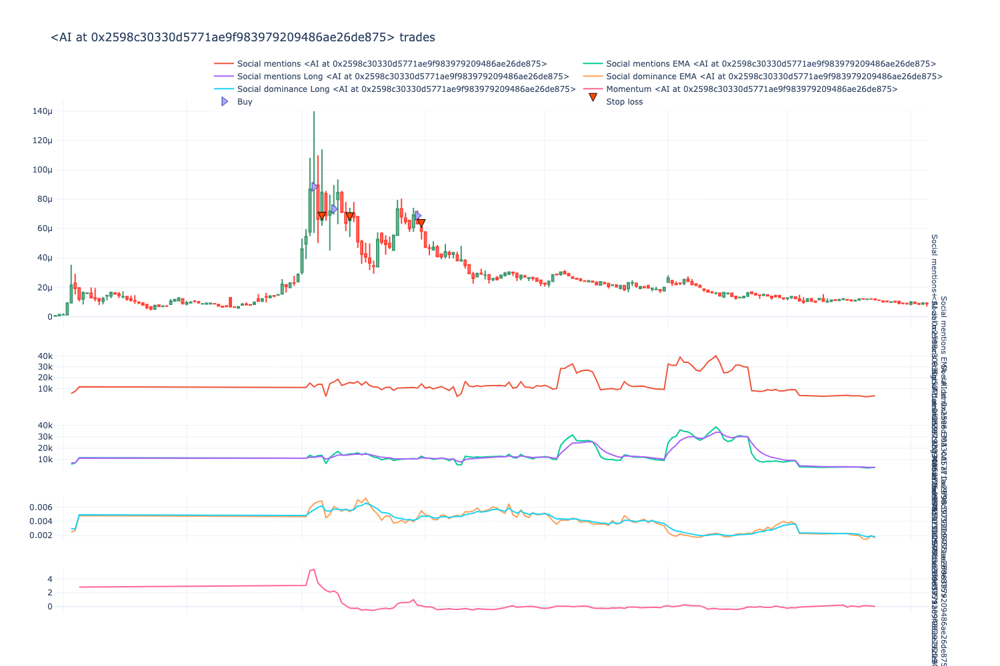

In [96]:

from tradeexecutor.visual.single_pair import visualise_single_pair
# from tradeexecutor.visual.
from tradingstrategy.charting.candle_chart import VolumeBarMode

start_at, end_at = state.get_strategy_start_and_end()   # Limit chart to our backtesting range
# btc_usdt = strategy_universe.get_pair_by_human_description(trading_pairs[0])
# 68900 PEOPLE
# 3228746 PEPE

figure = visualise_single_pair(
    state,
    pair_id=sample_pair.internal_id,
    execution_context=notebook_execution_context,
    candle_universe=strategy_universe.data_universe.candles,
    start_at=pd.Timestamp('2023-01-01'), #start_at,
    end_at=pd.Timestamp('2024-12-01'),#end_at, #pd.Timestamp('2023-10-01'),
    volume_bar_mode=VolumeBarMode.hidden,
    volume_axis_name="Volume (USD)",
    height = 800,
    title=f"{sample_pair.base} trades",
    detached_indicators=True
)

# write_pickle_to_gcs(figure, "test/eth_memecoin_fig_single_pair_latest.pkl")


figure.show()

# Equity curve

- Equity curve shows how your strategy accrues value over time
- A good equity curve has a stable ascending angle
- Benchmark against MATIC buy and hold

/var/folders/vd/s7y9nsh17j58nlkxbx68vhmw0000gn/T/ipykernel_95205/1310356924.py:11: DeprecationWarning:

Pass parameter state instead of portfolio_statistics



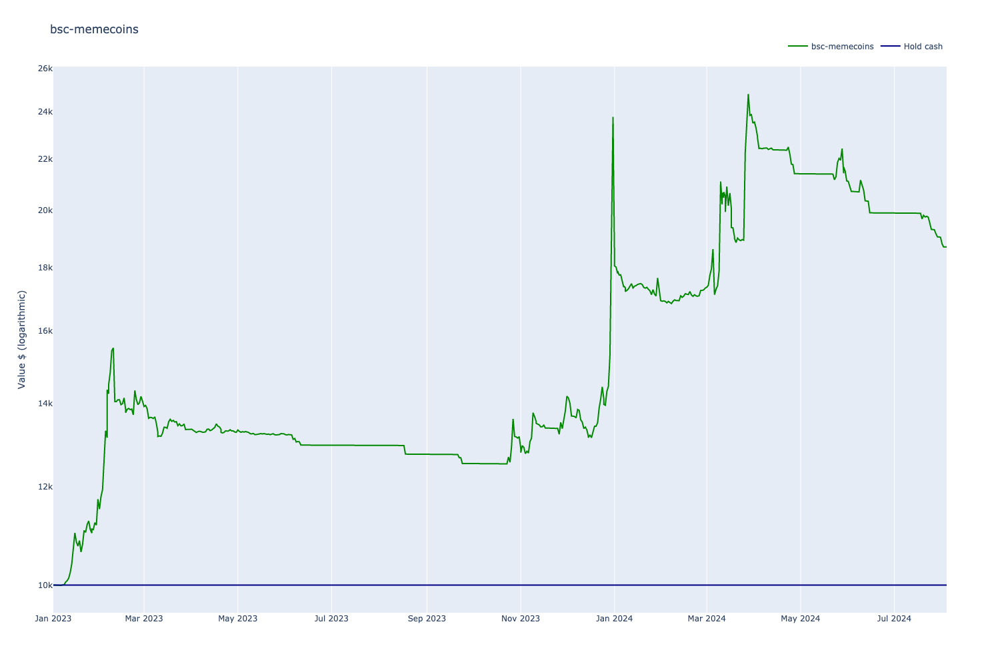

In [129]:
import pandas as pd
from tradeexecutor.analysis.multi_asset_benchmark import get_benchmark_data
from tradeexecutor.visual.benchmark import visualise_equity_curve_benchmark

# Pulls WMATIC/USDC as the benchmark
benchmark_indexes = get_benchmark_data(
    strategy_universe,
    cumulative_with_initial_cash=state.portfolio.get_initial_cash()
)

fig = visualise_equity_curve_benchmark(
    name=state.name,
    portfolio_statistics=state.stats.portfolio,
    all_cash=state.portfolio.get_initial_cash(),
    benchmark_indexes=benchmark_indexes,
    height=800,
    log_y=True,
)

fig.show()

In [20]:
state

NameError: NameError: name 'state' is not defined

In [21]:
import pandas as pd
import plotly.graph_objects as go

# Example to demonstrate using a figure (This should be replaced with your actual fig object)
# fig = go.Figure() # You would actually use your existing 'fig' from your code

# Function to extract data from Plotly figure
def extract_data_from_plotly_fig(fig):
    data = {}
    dates = None

    for trace in fig.data:
        if 'x' in trace and 'y' in trace:
            if dates is None:
                dates = trace.x  # Assuming all traces share the same 'x' dates
            data[trace.name] = trace.y

    # Creating DataFrame
    df = pd.DataFrame(data, index=dates)
    df.index.name = 'Date'
    return df

# Call the function with your figure
df = extract_data_from_plotly_fig(fig)

# Saving the DataFrame to CSV
csv_path = "gs://taraxa-research/test/extracted_trendspotting_backtest_plot_data.csv"
df.to_csv(csv_path)

# Output to check
print(df.head())

NameError: NameError: name 'fig' is not defined

# Performance metrics

- Display portfolio performance metrics
- Compare against buy and hold matic using the same initial capital

In [93]:
from tradeexecutor.analysis.multi_asset_benchmark import compare_strategy_backtest_to_multiple_assets

compare_strategy_backtest_to_multiple_assets(
    state,
    strategy_universe,
    display=True,
)

,Strategy
Start Period,2023-01-01
End Period,2024-08-04
Risk-Free Rate,0.0%
Time in Market,64.0%
Cumulative Return,86.92%
CAGR﹪,48.14%
Sharpe,1.07
Prob. Sharpe Ratio,92.72%
Sortino,1.99
Sortino/√2,1.4


# Trading statistics

- Display summare about made trades

In [61]:
from tradeexecutor.analysis.trade_analyser import build_trade_analysis

analysis = build_trade_analysis(state.portfolio)
summary = analysis.calculate_summary_statistics()
display(summary.to_dataframe())

,0
Trading period length,559 days 0 hours
Trading start,None
Trading end,None
Return %,258.26%
Annualised return %,168.63%
Cash at start,"$10,000.00"
Value at end,"$35,825.51"
Time in market,19.32%
Time in market volatile,19.32%
Trade volume,"$224,995.97"


# Pair breakdown

- Profit for each trading pair

In [94]:
from tradeexecutor.analysis.multipair import analyse_multipair
from tradeexecutor.analysis.multipair import format_multipair_summary

multipair_summary = analyse_multipair(state)
display(format_multipair_summary(multipair_summary))

,Trading pair,Positions,Trades,Total return %,Total PnL USD,Best,Worst,Avg,Median,Volume,Wins,Losses,Take profits,Stop losses,Trailing stop losses,Volatility
9,CAT-WBNB spot,11,22,498.39%,"8,029.02",315.16%,-19.72%,45.31%,-11.84%,"58,935.84",4,7,0,11,4,104.71%
2,BabyDoge-WBNB spot,5,10,193.20%,"3,072.29",188.21%,-17.94%,38.64%,-9.70%,"21,118.88",2,3,0,5,2,78.05%
1,MILO-WBNB spot,3,6,63.65%,-112.01,88.84%,-13.55%,21.22%,-11.64%,"10,708.46",1,2,0,3,1,47.82%
11,PIT-WBNB spot,2,4,59.33%,"1,042.34",69.78%,-10.44%,29.67%,29.67%,"6,102.08",1,1,0,2,1,40.11%
0,FLOKI-WBNB spot,8,16,54.38%,150.22,41.13%,-21.02%,6.80%,-2.14%,"30,279.73",4,4,0,8,4,25.13%
7,KATA-WBNB spot,6,12,25.01%,404.70,39.41%,-15.43%,4.17%,-1.28%,"22,338.30",3,3,0,6,3,19.33%
8,CUMMIES-WBNB spot,4,8,1.38%,-309.43,42.57%,-23.02%,0.34%,-9.09%,"15,219.37",1,3,0,4,2,25.84%
3,DOGE-WBNB spot,2,4,-4.30%,-62.21,10.21%,-14.51%,-2.15%,-2.15%,"4,945.90",1,1,0,2,1,12.36%
16,FEG-WBNB spot,1,2,-10.89%,-307.96,-10.89%,-10.89%,-10.89%,-10.89%,"5,345.72",0,1,0,1,0,0.00%
14,BabyTrump-WBNB spot,1,2,-12.04%,-354.13,-12.04%,-12.04%,-12.04%,-12.04%,"5,527.34",0,1,0,1,0,0.00%


# Sheet 2